# Py-ART Animation
### Choosing the radar volume from a Nexrad site over a time span. 

### Based on code by Scott Collis:
https://github.com/scollis/radar_in_the_cloud/blob/master/notebooks/Matthew.ipynb 

### Jonathan Helmus:
https://anaconda.org/jjhelmus/scipy2015_openaccessradar_jjh/notebook

### and memory fixes by Robert Jackson:
https://github.com/rcjackson/pyart_practice/blob/master/nexrad_animatedgif.py

Note: NEXRAD s3 files are set in UTC. 

Note: This notebooks has less examples for the sake of memory/rendering in github.

In [1]:
from boto.s3.connection import S3Connection
import pyart
import gzip
from matplotlib import pyplot as plt
from datetime import date, datetime, timedelta
from matplotlib import animation
import tempfile
import numpy as np
import pandas as pd
from IPython.display import Image, display
get_ipython().magic('matplotlib inline')
get_ipython().magic(
    'install_ext https://raw.github.com/cpcloud/ipython-\
autotime/master/autotime.py')
get_ipython().magic('load_ext autotime')


## You are using the Python ARM Radar Toolkit (Py-ART), an open source
## library for working with weather radar data.
##
## If you use this software to prepare a publication, please cite:
##
##     JJ Helmus and SM Collis, JORS 2016, doi: 10.5334/jors.119 


ERROR:root:Line magic function `%install_ext` not found.


In [3]:
# Function for pulling all keys between two dates at a chosen nexrad site.


def nexrad_site_datespan(start_date=None, start_date_time=None,
                         end_date=None, end_date_time=None, site=None):

    """
    Get all volumes of NEXRAD data between two particular datetimes.
    Parameters
    ----------
    start_date : string
        eight number date, for example '20150623'
    start_date_time : string
        six number time, for example '145501'
    end_date : string
        eight number date or 'Now' to retrieve current UTC
    end_date_time : string, optional if end_date = 'Now'
        six number time
    site : string
        four letter radar designation in, for example 'KJAX'

    """

    fmt = '%Y%m%d_%H%M%S'

    # Allows for the choice of now for the end date so current UTC is pulled.

    if end_date.upper() == 'NOW':
        e_d_selected = datetime.utcnow()
    else:
        e_d_selected = datetime.strptime(end_date + '_' + end_date_time, fmt)

    s_d = datetime.strptime(start_date + '_' + start_date_time, fmt)
    e_d_fixed = e_d_selected + timedelta(days=1)

    if s_d > e_d_selected:
            raise ValueError('You provided a start date' 
                             ' that comes after the end date.')

    times = []
    for timestamp in datespan((s_d), (e_d_fixed), delta=timedelta(days=1)):
        time = timestamp
        times += [datetime.strftime(time, '%Y/%m/%d/' + site.upper())]

    conn = S3Connection(anon=True)
    bucket = conn.get_bucket('noaa-nexrad-level2')

    # Get a list of files

    keys = []
    datetimes = []
    for time in times:
        bucket_list = list(bucket.list(time))
        for i in range(len(bucket_list)):
            this_str = str(bucket_list[i].key)
            if 'gz' in this_str:
                endme = this_str[-22:-3]
                fmt = '%Y%m%d_%H%M%S_V06'
                dt = datetime.strptime(endme, fmt)
                datetimes.append(dt)
                keys.append(bucket_list[i])

            if this_str[-3::] == 'V06':
                endme = this_str[-19::]
                fmt = '%Y%m%d_%H%M%S_V06'
                dt = datetime.strptime(endme, fmt)
                datetimes.append(dt)
                keys.append(bucket_list[i])

    # Code belows chooses all keys between the user's dates.

    d = {'keys': keys}
    key_object = pd.DataFrame(data=d, index=pd.to_datetime(datetimes))

    selected_keys = key_object.loc[s_d: e_d_selected, :]
    # radar_datetimes = selected_keys.index.tolist()
    data_keys = selected_keys['keys'].tolist()
    return data_keys

time: 61.7 ms


In [3]:
# Conversion of keys to pyart radar objects.
def radar_keys_to_data(keys):
    localfile = tempfile.NamedTemporaryFile()
    keys.get_contents_to_filename(localfile.name)
    # Only pulling two scans for the sake of time and memory.
    radar = pyart.io.read_nexrad_archive(localfile.name, scans=[0, 1])
    return radar

def datespan(start_date, end_date, delta=timedelta(days=1)):
    current_date = start_date
    while current_date < end_date:
        yield current_date
        current_date += delta

time: 2.75 ms


In [42]:
# Plotting and creating an animation using the radar datas.
# Something close to home.
# Use the option of saying 'now' to retrieve current UTC.

my_data_keys_klot = nexrad_site_datespan(start_date='20161019',
                                         start_date_time='125000',
                                         end_date='Now', site='klot')

# Showing that the nexrad_site_datespan
# function correctly retrieved all keys between each date.
print(my_data_keys_klot)

# Creating a gif of all volumes between both dates.

def animate(nframe):
    plt.clf()
    radar = radar_keys_to_data(my_data_keys_klot[nframe])
    display = pyart.graph.RadarMapDisplay(radar)
    display.plot_ppi_map('reflectivity', sweep=0, resolution='l',
                         vmin=-8, vmax=64, mask_outside=False,
                         cmap=pyart.graph.cm.NWSRef,
                         lat_lines=None, lon_lines=None)
    display.basemap.drawcounties()

fig = plt.figure(figsize=(10, 8))
anim_klot = animation.FuncAnimation(fig, animate,
                                    frames=len(my_data_keys_klot))
anim_klot.save('/home/zsherman/pyart_animation/images/klot_reflectivity_animation.gif',
               writer='imagemagick', fps=5)
plt.close()

[<Key: noaa-nexrad-level2,2016/10/19/KLOT/KLOT20161019_125406_V06>, <Key: noaa-nexrad-level2,2016/10/19/KLOT/KLOT20161019_130324_V06>, <Key: noaa-nexrad-level2,2016/10/19/KLOT/KLOT20161019_131246_V06>, <Key: noaa-nexrad-level2,2016/10/19/KLOT/KLOT20161019_132207_V06>, <Key: noaa-nexrad-level2,2016/10/19/KLOT/KLOT20161019_133127_V06>, <Key: noaa-nexrad-level2,2016/10/19/KLOT/KLOT20161019_134048_V06>, <Key: noaa-nexrad-level2,2016/10/19/KLOT/KLOT20161019_135023_V06>, <Key: noaa-nexrad-level2,2016/10/19/KLOT/KLOT20161019_135520_V06>, <Key: noaa-nexrad-level2,2016/10/19/KLOT/KLOT20161019_140015_V06>, <Key: noaa-nexrad-level2,2016/10/19/KLOT/KLOT20161019_140510_V06>, <Key: noaa-nexrad-level2,2016/10/19/KLOT/KLOT20161019_141004_V06>, <Key: noaa-nexrad-level2,2016/10/19/KLOT/KLOT20161019_141459_V06>, <Key: noaa-nexrad-level2,2016/10/19/KLOT/KLOT20161019_141954_V06>, <Key: noaa-nexrad-level2,2016/10/19/KLOT/KLOT20161019_142448_V06>, <Key: noaa-nexrad-level2,2016/10/19/KLOT/KLOT20161019_142943_

/home/zsherman/anaconda3/lib/python3.5/site-packages/IPython/core/formatters.py:92: DeprecationWarning: DisplayFormatter._ipython_display_formatter_default is deprecated: use @default decorator instead.
  def _ipython_display_formatter_default(self):
/home/zsherman/anaconda3/lib/python3.5/site-packages/IPython/core/formatters.py:669: DeprecationWarning: PlainTextFormatter._singleton_printers_default is deprecated: use @default decorator instead.
  def _singleton_printers_default(self):


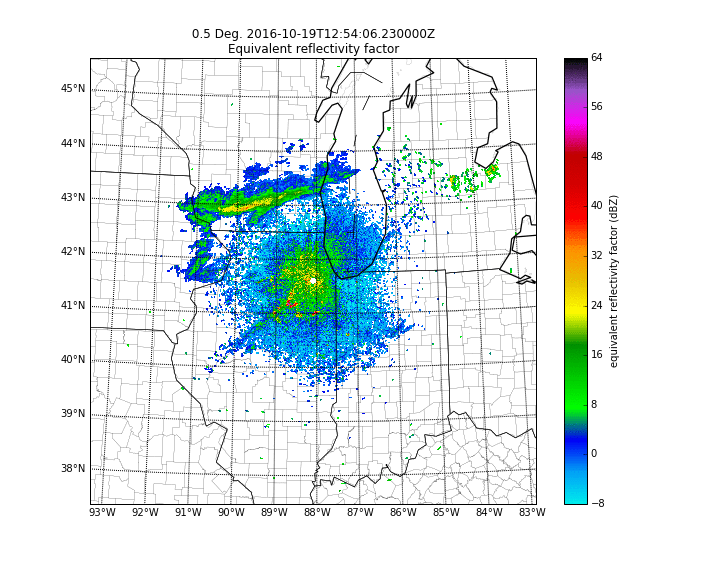

time: 57.8 ms


In [4]:
# The gifs created will not run inline in Jupyter Notebook,
# unless the gif files are opened.
with open('/home/zsherman/pyart_animation/images/klot_reflectivity_animation.gif',
          'rb') as f:
    display(Image(f.read()), format='png')

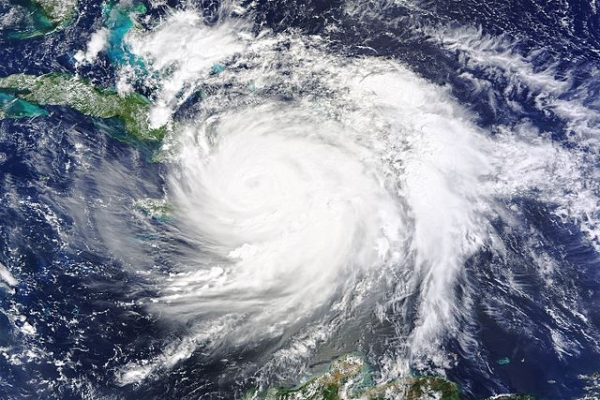

time: 7.53 ms


In [6]:
# Now let's check out recent event Hurricane Matthew.
with open('/home/zsherman/Pictures/hurricane-matthew.jpg', 'rb') as f:
    display(Image(f.read()), format='jpg')

# image source:
# http://www.nasa.gov/image-feature/hurricane-matthew-hits-haiti

In [8]:
max_lat_kamx = 31
min_lat_kamx = 23
min_lon_kamx = -84
max_lon_kamx = -76

lal = np.arange(min_lat_kamx, max_lat_kamx, 1)
lol = np.arange(min_lon_kamx, max_lon_kamx, 1)

my_data_keys_kamx = nexrad_site_datespan(start_date='20161007',
                                         start_date_time='015000',
                                         end_date='20161007',
                                         end_date_time='045000',
                                         site='KAMX')

def animate(nframe):
    plt.clf()
    radar = radar_keys_to_data(my_data_keys_kamx[nframe])
    display = pyart.graph.RadarMapDisplay(radar)
    display.plot_ppi_map('reflectivity', sweep=0, resolution='l',
                         vmin=-8, vmax=64, mask_outside=False,
                         cmap=pyart.graph.cm.NWSRef,
                         min_lat=min_lat_kamx, min_lon=min_lon_kamx,
                         max_lat=max_lat_kamx, max_lon=max_lon_kamx,
                         lat_lines=lal, lon_lines=lol)
    display.basemap.drawcounties()
    plt.close()
fig = plt.figure(figsize=(10, 8))
anim_kamx = animation.FuncAnimation(fig, animate,
                                    frames=len(my_data_keys_kamx))
anim_kamx.save('/home/zsherman/pyart_animation/images/kamx_reflectivity_animation.gif',
               writer='imagemagick', fps=5)
plt.close()

time: 5min 45s


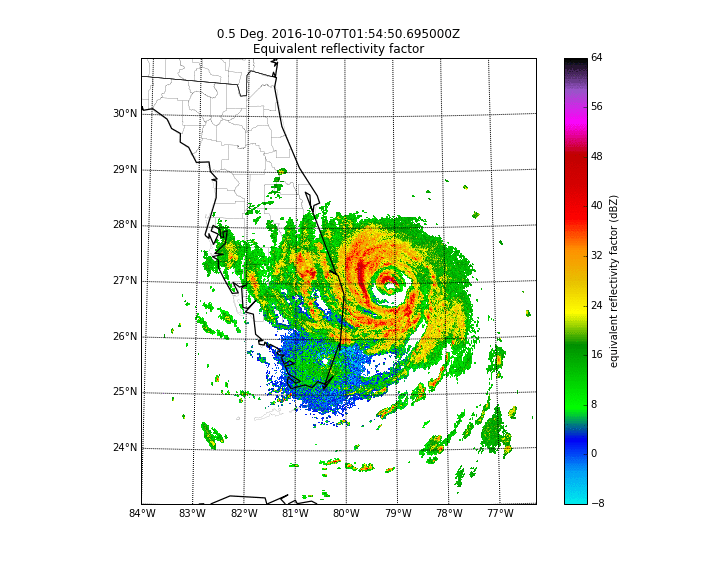

time: 54.7 ms


In [5]:
with open('/home/zsherman/pyart_animation/images/kamx_reflectivity_animation.gif',
          'rb') as f:
    display(Image(f.read()), format='png')

In [10]:
def animate(nframe):
    plt.clf()
    radar = radar_keys_to_data(my_data_keys_kamx[nframe])
    display = pyart.graph.RadarMapDisplay(radar)
    display.plot_ppi_map('velocity', sweep=1, resolution='l',
                         vmin=-33, vmax=33, mask_outside=False,
                         cmap=pyart.graph.cm.NWSVel,
                         min_lat=min_lat_kamx, min_lon=min_lon_kamx,
                         max_lat=max_lat_kamx, max_lon=max_lon_kamx,
                         lat_lines=lal, lon_lines=lol)
    display.basemap.drawcounties()

fig = plt.figure(figsize=(10, 8))
anim_kamx = animation.FuncAnimation(fig, animate,
                                    frames=len(my_data_keys_kamx))
anim_kamx.save('/home/zsherman/pyart_animation/images/kamx_velocity_animation.gif',
               writer='imagemagick', fps=5)
plt.close()

time: 5min 43s


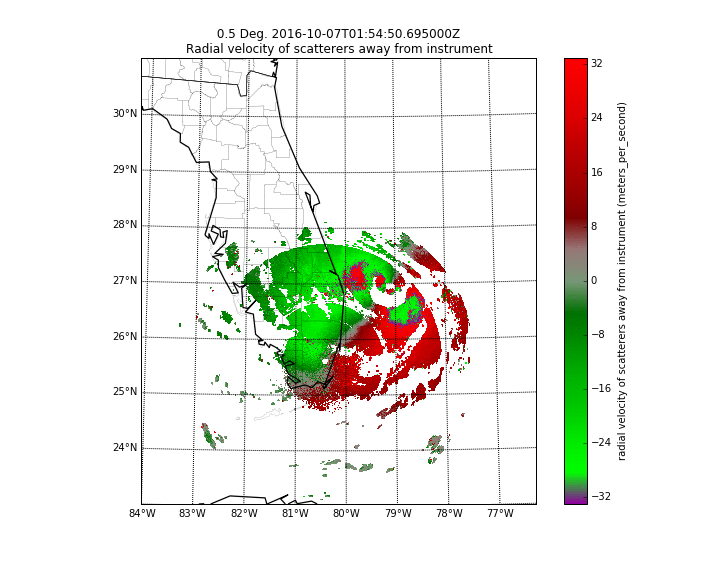

time: 30 ms


In [11]:
with open('/home/zsherman/pyart_animation/images/kamx_velocity_animation.gif',
          'rb') as f:
    display(Image(f.read()), format='png')

In [17]:
# Replotting velocity after being corrected with pyart.


def animate(nframe):
    plt.clf()
    radar = radar_keys_to_data(my_data_keys_kamx[nframe])
    
    gatefilter = pyart.correct.GateFilter(radar)
    gatefilter.exclude_masked('reflectivity')
    corr_vel = pyart.correct.dealias_region_based(radar, vel_field='velocity',
                                                  keep_original=False,
                                                  gatefilter=gatefilter,
                                                  nyquist_vel=33.01, centered=True)
    radar.add_field('corrected_velocity', corr_vel, replace_existing=True)

    display = pyart.graph.RadarMapDisplay(radar)
    display.plot_ppi_map('corrected_velocity', sweep=1, resolution='l',
                         vmin=-60, vmax=60, mask_outside=False,
                         cmap=pyart.graph.cm.NWSVel,
                         min_lat=min_lat_kamx, min_lon=min_lon_kamx,
                         max_lat=max_lat_kamx, max_lon=max_lon_kamx,
                         lat_lines=lal, lon_lines=lol)
    display.basemap.drawcounties()

fig = plt.figure(figsize=(10, 8))
anim_kamx = animation.FuncAnimation(fig, animate,
                                    frames=len(my_data_keys_kamx))
anim_kamx.save(
    '/home/zsherman/pyart_animation/images/kamx_corrected_velocity_animation.gif',
    writer='imagemagick', fps=5)
plt.close()

time: 7min 23s


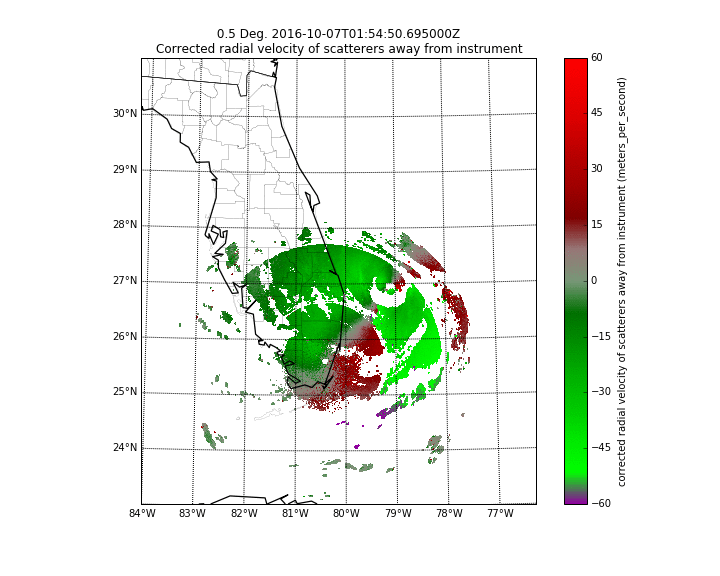

time: 41.4 ms


In [7]:
with open(
    '/home/zsherman/pyart_animation/images/kamx_corrected_velocity_animation.gif',
     'rb') as f:
    display(Image(f.read()), format='png')

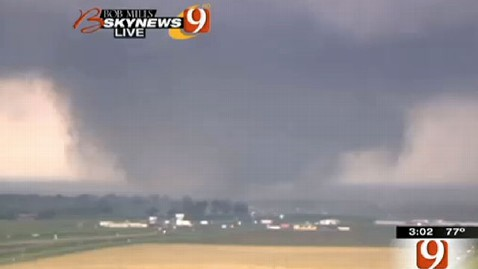

time: 2.42 ms


In [29]:
# On the topic of large tornadoes, here is the Moore Oklahoma tornado.
with open('/home/zsherman/Pictures/moore-tornado.jpg', 'rb') as f:
    display(Image(f.read()), format='jpg')
# image source:
# http://abcnews.go.com/blogs/headlines/2013/05/live-updates-of-tornado-
# damage-in-oklahoma/

In [30]:
max_lat_moore = 35.646650
min_lat_moore = 35.052392
min_lon_moore = -97.848925
max_lon_moore = -97.203586

my_data_keys_moore = nexrad_site_datespan(start_date='20130520',
                                          start_date_time='190000',
                                          end_date='20130520',
                                          end_date_time='210000',
                                          site='KTLX')

def animate(nframe):
    plt.clf()
    radar = radar_keys_to_data(my_data_keys_moore[nframe])
    display = pyart.graph.RadarMapDisplay(radar)
    display.plot_ppi_map('reflectivity', sweep=1, resolution='l',
                         vmin=-8, vmax=64, mask_outside=False,
                         cmap=pyart.graph.cm.NWSRef,
                         min_lat=min_lat_moore, min_lon=min_lon_moore,
                         max_lat=max_lat_moore, max_lon=max_lon_moore,
                         lat_lines=None, lon_lines=None)
    display.basemap.drawcounties()
fig = plt.figure(figsize=(10, 8))
anim_moore = animation.FuncAnimation(fig, animate,
                                     frames=len(my_data_keys_moore))
anim_moore.save(
    '/home/zsherman/pyart_animation/images/ktlx_moore_reflectivity_animation.gif',
    writer='imagemagick', fps=2)
plt.close()

time: 3min 54s


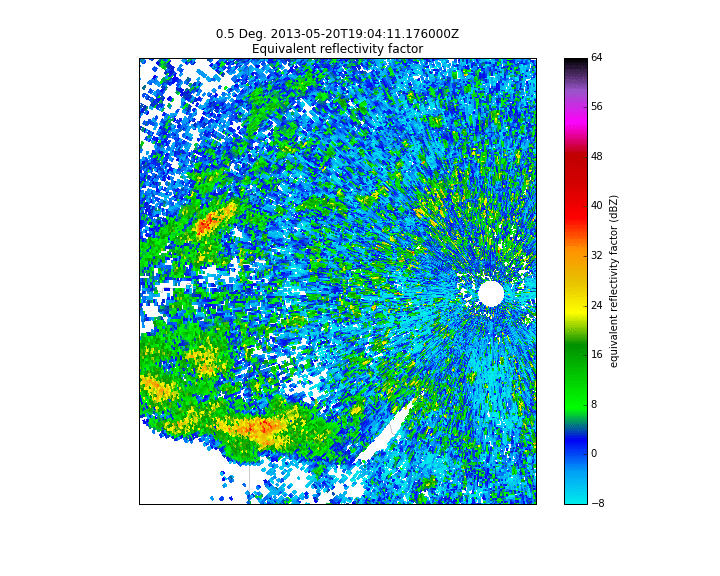

time: 61.3 ms


In [31]:
with open(
    '/home/zsherman/pyart_animation/images/ktlx_moore_reflectivity_animation.gif',
    'rb') as f:
    display(Image(f.read()), format='png')

In [32]:
def animate(nframe):
    plt.clf()
    radar = radar_keys_to_data(my_data_keys_moore[nframe])
    display = pyart.graph.RadarMapDisplay(radar)
    display.plot_ppi_map('velocity', sweep=1, resolution='l',
                         vmin=-60, vmax=60, mask_outside=False,
                         cmap=pyart.graph.cm.NWSVel,
                         min_lat=min_lat_moore, min_lon=min_lon_moore,
                         max_lat=max_lat_moore, max_lon=max_lon_moore,
                         lat_lines=None, lon_lines=None)
    display.basemap.drawcounties()

fig = plt.figure(figsize=(10, 8))
anim_moore = animation.FuncAnimation(fig, animate,
                                     frames=len(my_data_keys_moore))
anim_moore.save(
    '/home/zsherman/pyart_animation/images/ktlx_moore_velocity_animation.gif',
    writer='imagemagick', fps=2)
plt.close()

time: 3min 55s


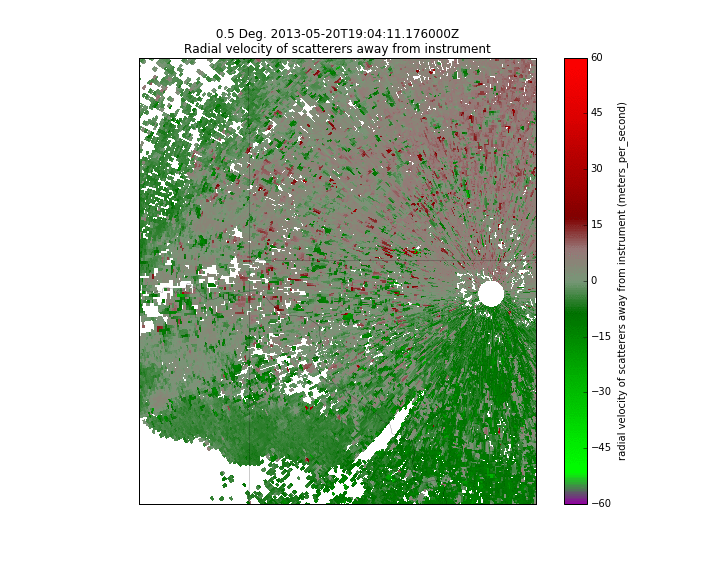

time: 43.5 ms


In [33]:
with open(
    '/home/zsherman/pyart_animation/images/ktlx_moore_velocity_animation.gif',
    'rb') as f:
    display(Image(f.read()), format='png')